

---



---


## EPIC IV

**Modelos de Clasificación Binaria**

El aprendizaje automático ha revolucionado numerosos campos al permitir el desarrollo de sistemas que aprenden de los datos y realizan predicciones. Entre las diversas tareas de aprendizaje automático, la clasificación es una de las fundamentales, ya que el objetivo es clasificar los datos en clases predefinidas. Este charla proporciona una visión general de los algoritmos de clasificación más populares, incluidos los árboles de decisión, la regresión logística, los vecinos más cercanos y las redes neuronales.




---



---



# **Librerías**

In [1]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

# Recopilación

## Carga de la data

In [2]:
# Carga el conjunto de datos Breast Cancer
dataset = load_breast_cancer()
data = pd.DataFrame(dataset["data"])
dataID = pd.DataFrame(dataset["target"])
data = pd.concat([dataID, data], axis=1)
data

,0,0,1,2,3,4,5,6,7,8,...,20,21,22,23,24,25,26,27,28,29
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


# Selección, limpieza y transformación

In [3]:
#Carga de Data y parametrización de nombres de las columnas
# Número de atributos: 32 (ID, diagnóstico, 30 características de entrada de valor real)
#	a) radius (mean of distances from center to points on the perimeter)
#	b) texture (standard deviation of gray-scale values)
#	c) perimeter
#	d) area
#	e) smoothness (local variation in radius lengths)
#	f) compactness (perimeter^2 / area - 1.0)
#	g) concavity (severity of concave portions of the contour)
#	h) concave points (number of concave portions of the contour)
#	i) symmetry
#	j) fractal dimension ("coastline approximation" - 1)

data.columns=['Diagnosis',
              'radius1','texture1','perimeter1','area1','smoothness1','compactness1','concavity1','concave_points1','symmetry1','fractal_dimension1',
              'radius2','texture2','perimeter2','area2','smoothness2','compactness2','concavity2','concave_points2','symmetry2','fractal_dimension2',
              'radius3','texture3','perimeter3','area3','smoothness3','compactness3','concavity3','concave_points3','symmetry3','fractal_dimension3']



## Transformación de la data

In [4]:
#Creo un nuevo dataset con las 11
#Para cada imagen se calcularon la media, el error estándar y el «peor» o mayor (la media de los tres valores más grandes).
#Se calcularon para cada imagen, lo que da como resultado 30 características.
#Por ejemplo, el campo 3 es Radio medio, el campo 13 es el Radio SE, el campo 23 es el Peor Radio.

dataDC = data[['Diagnosis','radius1','texture1','perimeter1','area1','smoothness1','compactness1','concavity1','concave_points1','symmetry1','fractal_dimension1']]
dataDC.columns=['Diagnóstico','Radio','Textura','Perímetro','Área','Suavidad','Compacidad','Concavidad','Puntos Cóncavos','Simetría','Dimensión Fractal']
dataDC

,Diagnóstico,Radio,Textura,Perímetro,Área,Suavidad,Compacidad,Concavidad,Puntos Cóncavos,Simetría,Dimensión Fractal
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883
...,...,...,...,...,...,...,...,...,...,...,...
564,0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623
565,0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533
566,0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648
567,0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016


In [5]:
import numpy as np
# Eliminacin de  outliers
feature = "Radio"

# Calcular el 25th y 75th percentile de la columna
Q1, Q3 = np.percentile(dataDC[feature], q=25), np.percentile(dataDC[feature], q=75)

# Seleccionar y calacular outlier range usando interquartile
outlier_range =   3 * (Q3 - Q1)

# Outliers en la data
num_data = dataDC[((dataDC["Radio"] < (Q1 - outlier_range)) | (dataDC["Radio"] > (Q3 + outlier_range)))].shape[0]

# Eliminación outliers
dataDC = dataDC[~((dataDC["Radio"] < (Q1 - outlier_range)) | (dataDC["Radio"] > (Q3 + outlier_range)))].reset_index(drop = True)

# Muestra numero de outliers
print("Numero de outliers eliminados: ", num_data)

Numero de outliers eliminados:  1


## Estadística Descriptiva

In [6]:
#verifica las estadísticas básicas del dataset
print('Estadísticas del dataset:')
print(dataDC.describe())
print('\n')
print('Información del dataset:')
print(dataDC.info())
print('\n')
print('Tamaño del dataset:')
print(dataDC.shape)

Estadísticas del dataset:
       Diagnóstico       Radio     Textura   Perímetro         Área  \
count   568.000000  568.000000  568.000000  568.000000   568.000000   
mean      0.628521   14.102674   19.291092   91.799085   651.642430   
std       0.483626    3.477843    4.304689   23.979546   343.589329   
min       0.000000    6.981000    9.710000   43.790000   143.500000   
25%       0.000000   11.697500   16.170000   75.135000   420.175000   
50%       1.000000   13.355000   18.855000   86.210000   548.750000   
75%       1.000000   15.780000   21.802500  103.875000   782.625000   
max       1.000000   27.420000   39.280000  186.900000  2501.000000   

         Suavidad  Compacidad  Concavidad  Puntos Cóncavos    Simetría  \
count  568.000000  568.000000  568.000000       568.000000  568.000000   
mean     0.096329    0.104258    0.088392         0.048724    0.181191   
std      0.014057    0.052822    0.079196         0.038558    0.027430   
min      0.052630    0.019380    0.000

In [7]:
#El numero de pacientes con el tamaño de dataframe
NroPacientes = dataDC.shape[0]

# Numero de pacientes con tumor benigno
NroB=dataDC.loc[(dataDC['Diagnóstico']==0)] #La B es 0
NroB=NroB.shape[0]

# Numero de pacientes con tumor maligno
NroM=dataDC.loc[(dataDC['Diagnóstico']==1)]
NroM=NroM.shape[0]

# Percentage of benign Class data
PorB = NroB*100/NroPacientes

# Print the results
print("Total de pacientes: {}".format(NroPacientes))
print("Numero de pacientes con tumor benigno: {}".format(NroB))
print("Numero de pacientes con tumor maligno: {}".format(NroM))
print("Porcentaje de pacientes con tumor benigno: {:.2f}%".format(PorB))

Total de pacientes: 568
Numero de pacientes con tumor benigno: 211
Numero de pacientes con tumor maligno: 357
Porcentaje de pacientes con tumor benigno: 37.15%


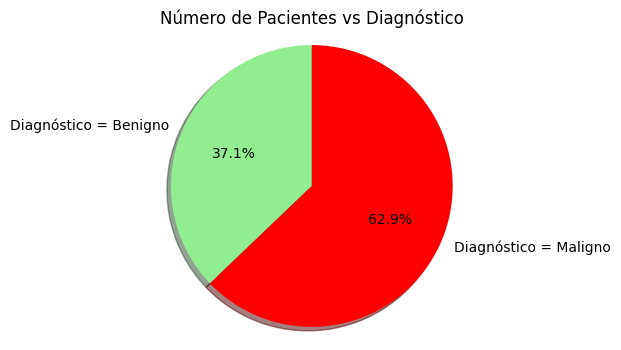

In [8]:
# Data to plot
import matplotlib.pyplot as plt
plt.figure(figsize = (4,4))
labels = 'Diagnóstico = Benigno', 'Diagnóstico = Maligno'
plt.title('Número de Pacientes vs Diagnóstico')
sizes = [NroB, NroM]
colors = ['lightgreen', 'red']

# Plot pie chart
plt.pie(sizes,  labels=labels, colors=colors,autopct='%1.1f%%', shadow=True, startangle=90)
plt.axis('equal')
plt.show()

## Histogramas

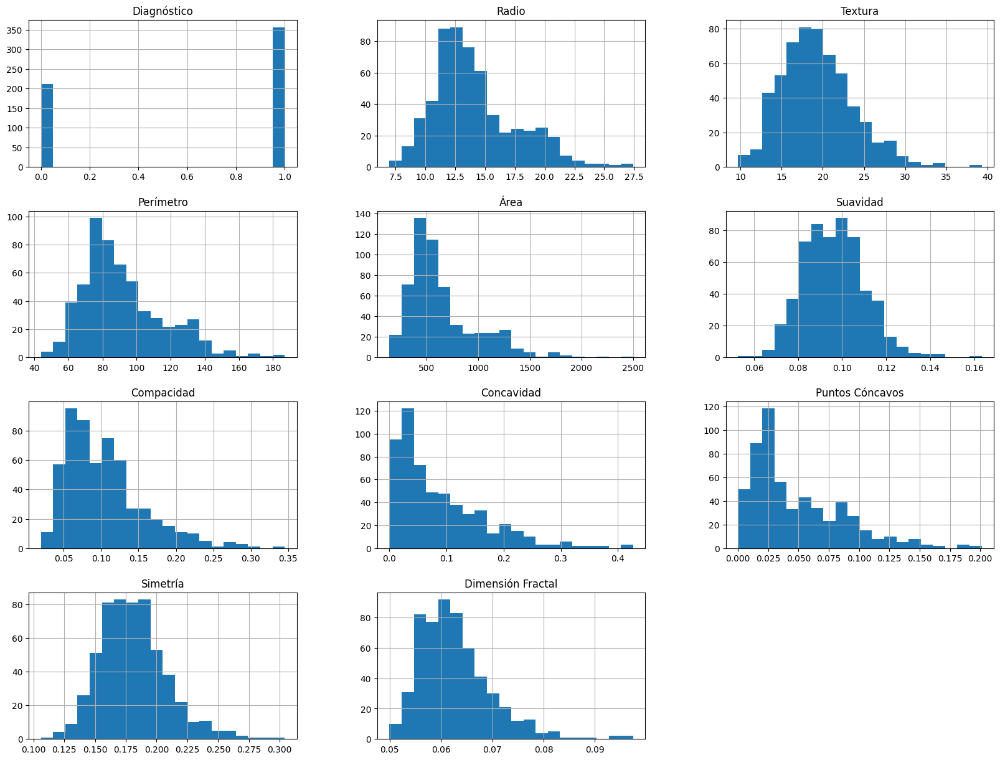

In [9]:
#Histogramas
import seaborn as sns
import matplotlib.pyplot as plt

dataDC.hist(figsize=(20, 15), bins=20)
plt.show()

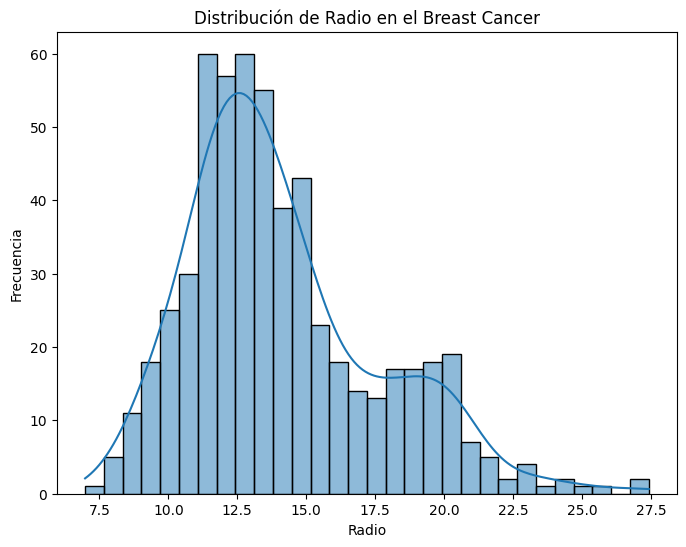

In [10]:
plt.figure(figsize=(8, 6))
sns.histplot(dataDC['Radio'].dropna(), bins=30, kde=True)
plt.xlabel('Radio')
plt.ylabel('Frecuencia')
plt.title('Distribución de Radio en el Breast Cancer')
plt.show()

## Correlación

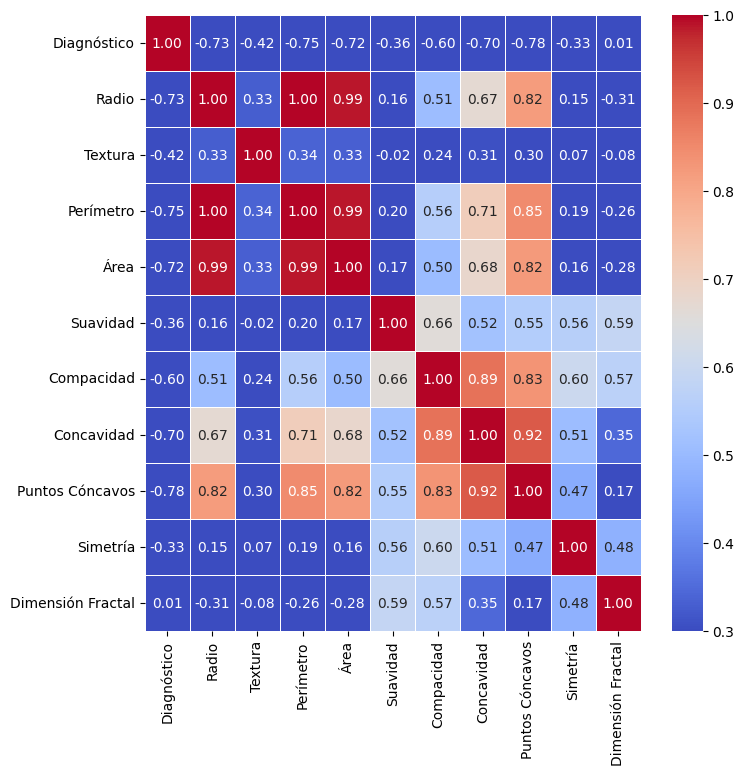

In [11]:
correlation = dataDC.corr()
plt.figure(figsize=(8, 8))
heatmap = sns.heatmap(correlation, annot=True, linewidths=0.5, linecolor="white",vmin=0.3, cmap="coolwarm",fmt='.2f')

## Gráficos Boxplot

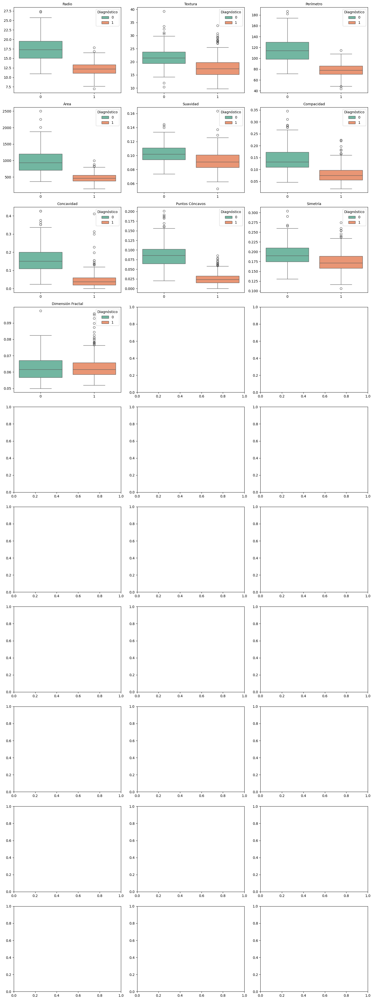

In [12]:
# Boxplot
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(15, 40))
axes = axes.flatten()

for i, columna in enumerate(dataDC.columns[1:]):  # Ignorar la columna de diagnóstico
    sns.boxplot(x='Diagnóstico', y=columna, data=dataDC, ax=axes[i], palette = "Set2" ,hue = 'Diagnóstico')
    axes[i].set_title(columna, fontsize=10)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.show()

##Pandas Profiling

In [13]:
# Instala la librería 'ydata_profiling' (Pandas Profiling) en el ambiente de desarrollo
!pip install ydata-profiling

# Importa la clase 'ProfileReport' desde 'ydata_profiling'
from ydata_profiling import ProfileReport

# Utiliza Pandas Profiler para generar un informe de perfilado de datos del DataFrame 'dataDC'
profile = ProfileReport(dataDC, title='Reporte Perfilamiento de Datos', explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
profile.to_file("cancer_report.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Minería de datos

## Modelo K-NN

### Carga de datos del modelo

In [15]:
#Variables
X = data.iloc[:, 1:31]# 555x11
#Etiqueta
Y = data.iloc[:, 0] #
data

,Diagnosis,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [16]:
# Divide el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2,random_state=42)
# Normaliza los datos para que todas las características tengan una escala similar
scaler = MinMaxScaler(feature_range=(0,1)) # [0, 1]
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [17]:
# Definir el modelo
knn = KNeighborsClassifier()

# Definir el espacio de hiperparámetros a buscar
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}


In [18]:
# Configurar GridSearchCV
grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')

# Ejecutar GridSearchCV para encontrar la mejor combinación de hiperparámetros
grid_search.fit(X_train, y_train)

# Imprimir los mejores hiperparámetros encontrados
best_params = grid_search.best_params_
print("Best parameters found: ", best_params)


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best parameters found:  {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'uniform'}


### Entrenamiento del modelo

In [19]:
# Crea y entrena el modelo K-NN
#model = KNeighborsClassifier(n_neighbors=7, p=2, # Función euclidean
#weights='uniform')

model = KNeighborsClassifier(
    n_neighbors=best_params['n_neighbors'],
    weights=best_params['weights'],
    metric=best_params['metric']
)
model.fit(X_train, y_train)
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5)


### Evaluación/Interpretación

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        43
           1       0.97      0.97      0.97        71

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114

confusion matrix: 
 [[41  2]
 [ 2 69]]


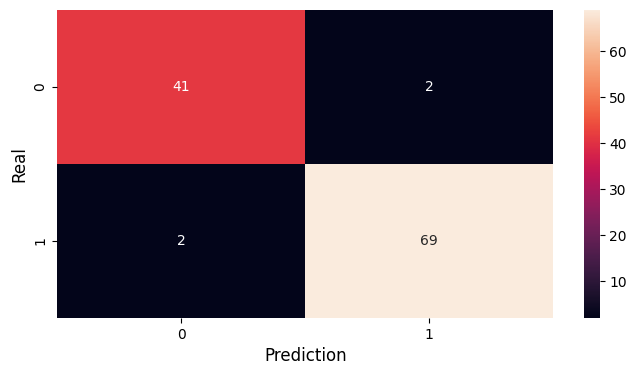

In [20]:
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix: \n", cm)
# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()


In [21]:
# Exactitud:

acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
# Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)

accuracy:  0.9649122807017544
recall:  0.971830985915493
precision:  0.971830985915493
specificity:  0.9534883720930233
f1 score:  0.971830985915493


auc:  0.9626596790042582


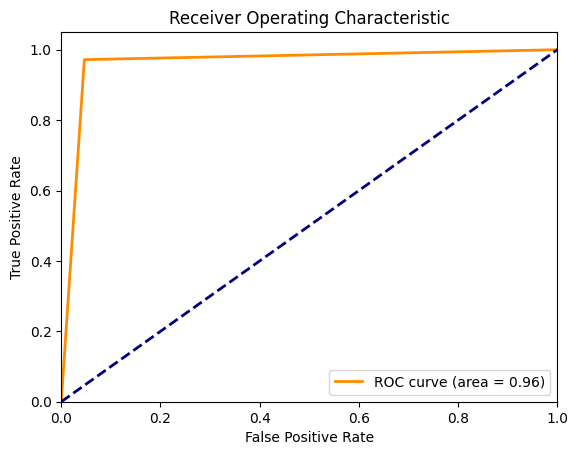

R2:  0.8506387160170324


In [22]:
# Área bajo la curva:
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)
# Curva ROC
from sklearn.metrics import roc_curve
plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# R Score (R^2 coefficient of determination)
from sklearn.metrics import r2_score
R = r2_score(y_test, y_pred)
print("R2: ", R)

##Modelo ANN


###Carga de datos del modelo

In [23]:
# Carga de datos para el modelo
X = dataDC.iloc[:, 1:31]
y = dataDC.iloc[:, 0]

### Entrenamiento del modelo

In [24]:
# Crea y entrena el modelo RNA
model = Sequential()
model.add(Dense(50, activation='tanh', input_dim=30))
model.add(Dropout(0.1))
model.add(Dense(1, activation='sigmoid'))
model.summary()

opt = Adam(lr = 1e-2) # by default lr=1e-3
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])
# Mostrar el resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                1550      
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 51        
                                                                 
Total params: 1601 (6.25 KB)
Trainable params: 1601 (6.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 50)                1550      
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 51        
                                                                 
Total params: 1601 (6.25 KB)
Trainable params: 1601 (6.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [25]:
# Entrenar el modelo
history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1,
         validation_data=(X_test, y_test))

Epoch 1/100
15/15 [==============================] - 3s 75ms/step - loss: 0.6886 - accuracy: 0.5363 - val_loss: 0.6376 - val_accuracy: 0.8772
Epoch 2/100
15/15 [==============================] - 0s 17ms/step - loss: 0.6182 - accuracy: 0.7780 - val_loss: 0.5677 - val_accuracy: 0.8158
Epoch 3/100
15/15 [==============================] - 1s 36ms/step - loss: 0.5578 - accuracy: 0.8505 - val_loss: 0.5041 - val_accuracy: 0.9386
Epoch 4/100
15/15 [==============================] - 0s 22ms/step - loss: 0.4988 - accuracy: 0.8681 - val_loss: 0.4559 - val_accuracy: 0.9123
Epoch 5/100
15/15 [==============================] - 0s 23ms/step - loss: 0.4627 - accuracy: 0.8593 - val_loss: 0.4154 - val_accuracy: 0.9123
Epoch 6/100
15/15 [==============================] - 0s 26ms/step - loss: 0.4251 - accuracy: 0.8901 - val_loss: 0.3765 - val_accuracy: 0.9386
Epoch 7/100
15/15 [==============================] - 0s 24ms/step - loss: 0.3872 - accuracy: 0.9121 - val_loss: 0.3443 - val_accuracy: 0.9386
Epoch 

### Evaluación/Interpretación

In [26]:
# Evaluar el modelo en el conjunto de prueba
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5).astype("int32")
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))

4/4 [==============================] - 0s 5ms/step
              precision    recall  f1-score   support

           0       0.95      0.98      0.97        43
           1       0.99      0.97      0.98        71

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



In [27]:
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix: \n", cm)


confusion matrix: 
 [[42  1]
 [ 2 69]]


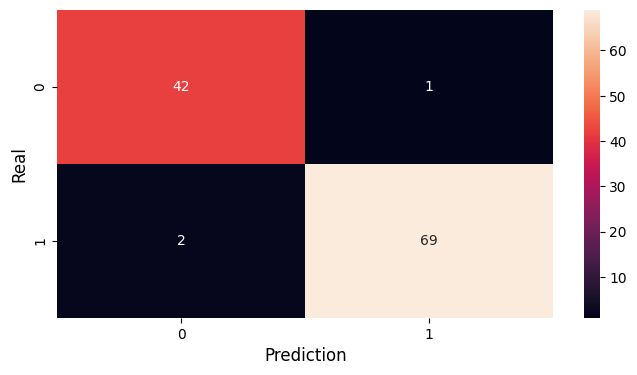

In [28]:
# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()

In [29]:
# Exactitud:
acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
# Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)


accuracy:  0.9736842105263158
recall:  0.971830985915493
precision:  0.9857142857142858
specificity:  0.9767441860465116
f1 score:  0.9787234042553192


auc:  0.9742875859810023


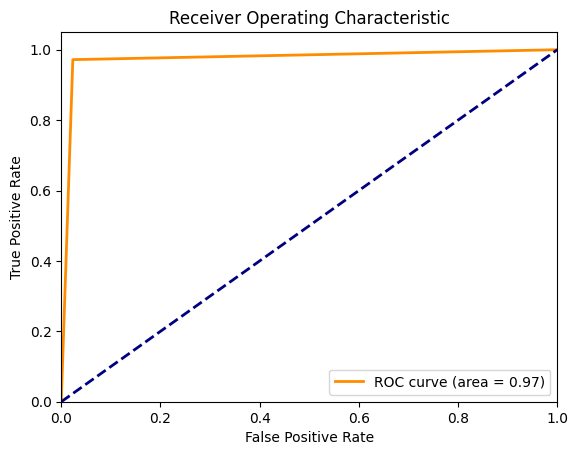

R2:  0.8879790370127744


In [30]:
# Área bajo la curva:
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)
# Curva ROC
plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()
# R Score (R^2 coefficient of determination)
from sklearn.metrics import r2_score
R = r2_score(y_test, y_pred)
print("R2: ", R)

## Regresión Lógistica

###Carga de datos del modelo

In [31]:
X = dataDC.iloc[:, 1:31]
y = dataDC.iloc[:, 0]

###Entrenamiento del modelo

In [32]:
# Divide el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [33]:
scaler = StandardScaler()
#scaler = MinMaxScaler(feature_range=(0,1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [34]:
# Definir el modelo
log_reg = LogisticRegression(random_state=42, max_iter=10000)

# Definir el espacio de hiperparámetros a buscar
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.01, 0.1, 1, 10, 100],  # Regularización inversa
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'l1_ratio': [None, 0.25, 0.5, 0.75]  # Sólo se usa si penalty es 'elasticnet'
}

In [35]:
# Crea y entrena el modelo de regresión logistica
model = LogisticRegression(multi_class='auto', solver='lbfgs', max_iter=100)
model.fit(X_train, y_train)

LogisticRegression()

###Evaluación/Interpretación

In [36]:
print("Coeficientes de modelo:")
print(model.coef_)
print("Intercepto de modelo:")
print(model.intercept_)
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5)

Coeficientes de modelo:
[[-1.01320778 -1.3710216  -0.94219989 -1.21898979 -0.98793907  0.22079668
  -0.99050001 -1.33096996 -0.56364216  0.39725962]]
Intercepto de modelo:
[0.70637191]


              precision    recall  f1-score   support

           0       0.95      0.90      0.92        41
           1       0.95      0.97      0.96        73

    accuracy                           0.95       114
   macro avg       0.95      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114

confusion matrix: 
 [[37  4]
 [ 2 71]]


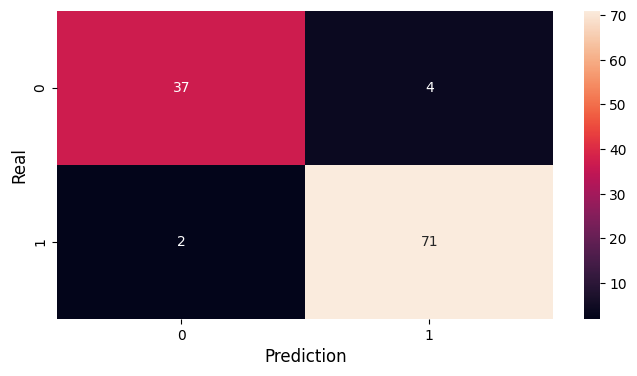

In [37]:
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix: \n", cm)
# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()

In [38]:
# Exactitud:
acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
# Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)
# Área bajo la curva:
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)

accuracy:  0.9473684210526315
recall:  0.9726027397260274
precision:  0.9466666666666667
specificity:  0.9024390243902439
f1 score:  0.9594594594594594
auc:  0.9375208820581357


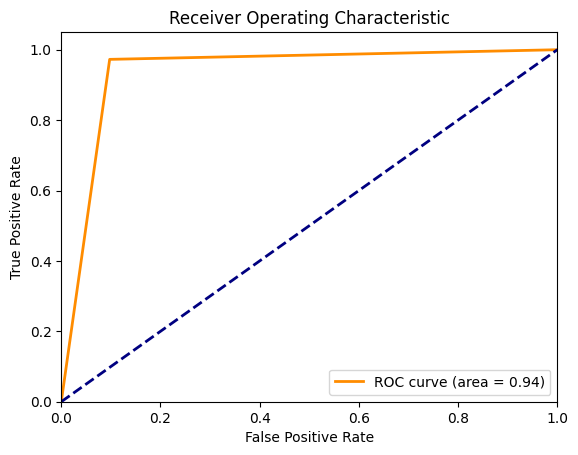

R2:  0.771466755763448


In [39]:
# Curva ROC
plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()
# R Score (R^2 coefficient of determination)
R = r2_score(y_test, y_pred)
print("R2: ", R)

##Modelo Árbol Decisiones

###Carga de datos del modelo

In [40]:
X = dataDC.iloc[:, 1:31]
y = dataDC.iloc[:, 0]

In [41]:
# Divide el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)
# Normaliza los datos para que tengan una escala similar
scaler = MinMaxScaler(feature_range=(0,1)) # [0, 1]
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

###Entrenamiento del modelo

In [42]:
# Crea y entrena el modelo de árbol de decisión
model = DecisionTreeClassifier(max_depth=4, criterion = 'gini')
model.fit(X_train, y_train)
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5)

### Evaluación/Interpretación

              precision    recall  f1-score   support

           0       0.88      0.93      0.90        41
           1       0.96      0.93      0.94        73

    accuracy                           0.93       114
   macro avg       0.92      0.93      0.92       114
weighted avg       0.93      0.93      0.93       114

confusion matrix: 
 [[38  3]
 [ 5 68]]


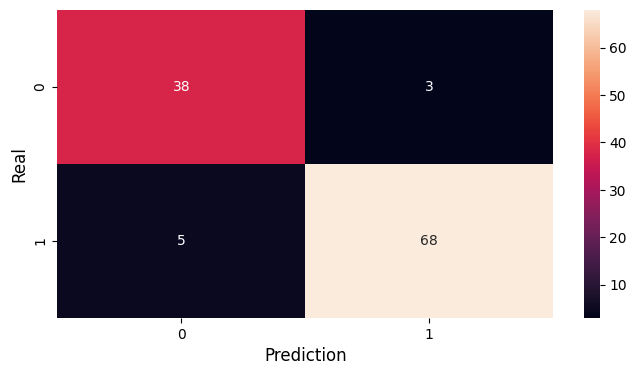

In [43]:
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print ("confusion matrix: \n", cm)
# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()


In [44]:
# Exactitud:
acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
#Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)
# Área bajo la curva:
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)

accuracy:  0.9298245614035088
recall:  0.9315068493150684
precision:  0.9577464788732394
specificity:  0.926829268292683
f1 score:  0.9444444444444444
auc:  0.9291680588038758


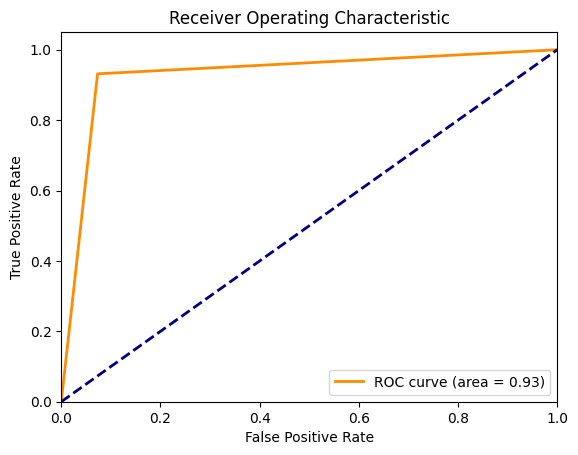

R2:  0.6952890076845973


In [45]:
# Curva ROC
plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()
# R Score (R^2 coefficient of determination)
R = r2_score(y_test, y_pred)
print("R2: ", R)

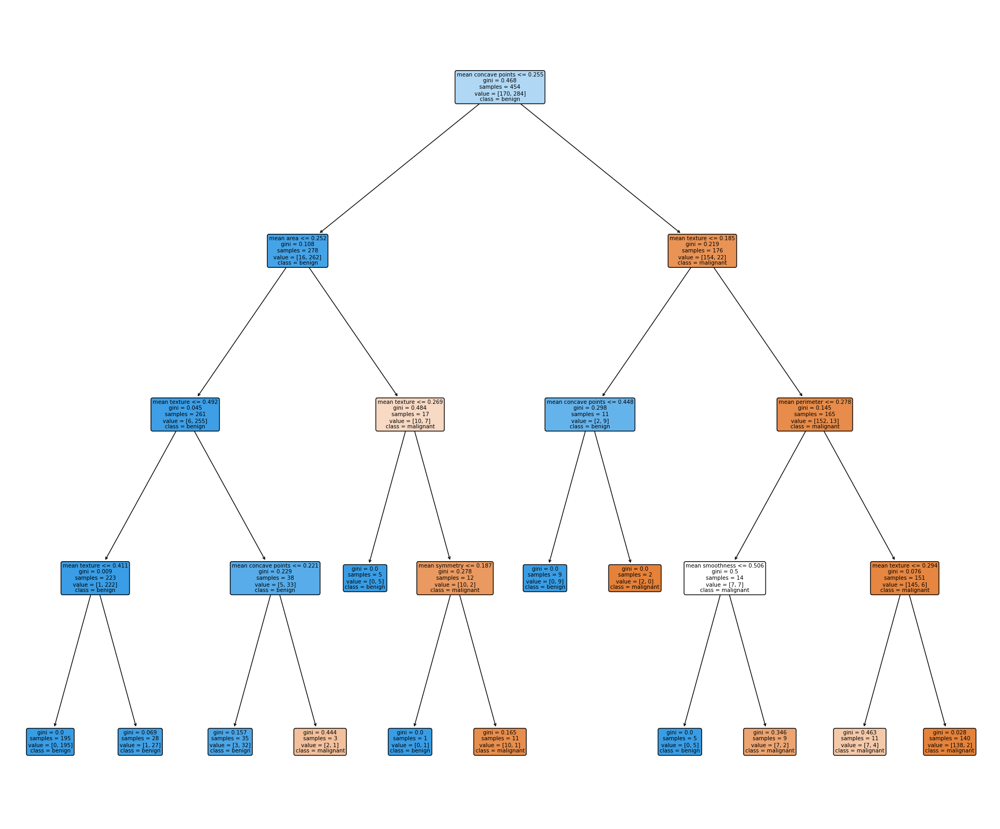

In [46]:
# Visualizar un árbol de decisión usando matplotlib
from sklearn.tree import plot_tree
# Crear la figura y el eje
fig, ax = plt.subplots(figsize=( 24, 20))
# Dibujar el árbol de decisión
plot_tree(model,
                feature_names = dataset.feature_names,
                class_names = dataset.target_names,
                filled=True,
                rounded=True,
                ax=ax)
# Mostrar la gráfica
plt.show()



---


**Reto de Modelos de Clasificación Binaria**


---



1.   Utilizar un dataset (Archivo o API) de clasificación binaria por ejemplo:
- Titanic https://calmcode.io/datasets/titanic
-
 Hotel Reservations Dataset https://www.kaggle.com/datasets/ahsan81/hotel-reservations-classification-dataset?resource=download
- Mushroom Dataset (Binary Classification) https://www.kaggle.com/datasets/prishasawhney/mushroom-dataset


2.   Evaluar dos modelos
3.   Mostrar un tabla resumen de las métricas
4.   Explicar la selección del modelo
5.   Modelo en producción (Recibir nuevos datos de los usuarios)


**Código de Referencia**
**Recopilación**

Carga de archivos CSV
dataframeName = pd.read_csv('Direccion')

Para Selección, limpieza y transformación

Usamos el método 'isnull()' para identificar los valores nulos y el método 'sum()' para sumarlos
dataframeName.isnull().sum()

Usamos el método 'dropna()' para eliminar las filas con valores nulos del DataFrame
dataframeName = dataframeName.dropna()

Usamos el método 'head()' para mostrar las primeras 5 filas de la base de datos
dataframeName.head()

Usamos el método 'unique()' para encontrar los valores únicos en la columna,
dataframeName['NameColumn'].unique()

Eliminamos las filas con el valor '.' (Valor que no corresponde) en la columna usando el método de filtrado por comparación negada '!='
dataframeName = dataframeName[dataframeName['NameColumn'] != '.']


**Repositorios**

https://archive.ics.uci.edu/

https://www.kaggle.com/

https://calmcode.io/datasets
